In [1]:
import cv2
import numpy as np
from PIL import Image

import os
import matplotlib.pyplot as plt

from skimage.feature import peak_local_max
from skimage.morphology import watershed

from scipy import ndimage

## 1 - Separate text from background

In [47]:
working_dir = 'task1/text/'
files = next(os.walk(working_dir))[2]

In [48]:
images = []
for file in files:
     #read images from data folder
    img = cv2.imread(os.path.join(working_dir, file))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    images.append(img)

In [49]:
def visualize(images):
    for img in images:
        plt.figure(figsize=(15, 15))
        plt.imshow(img, cmap='gray')
        plt.axis('off')

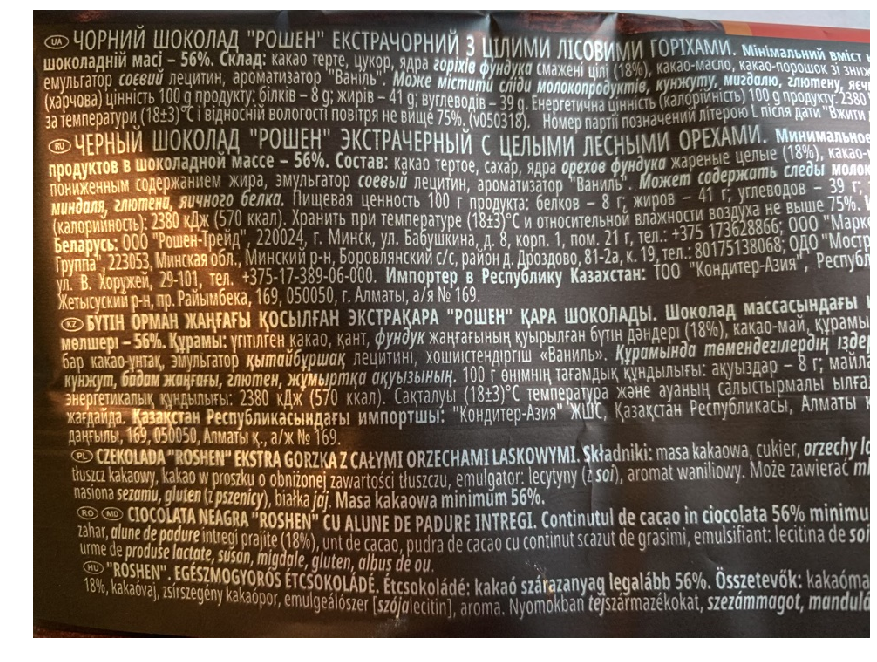

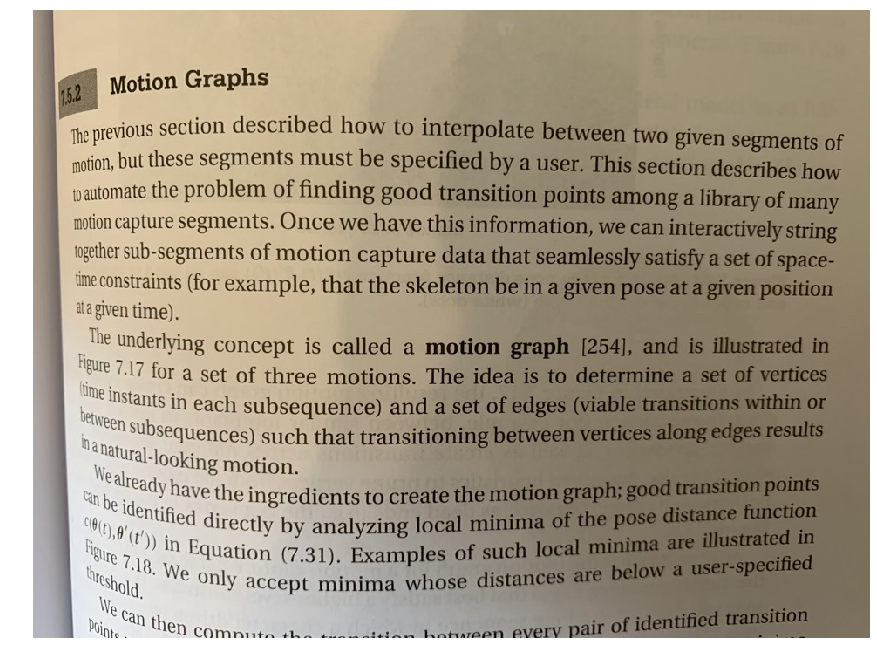

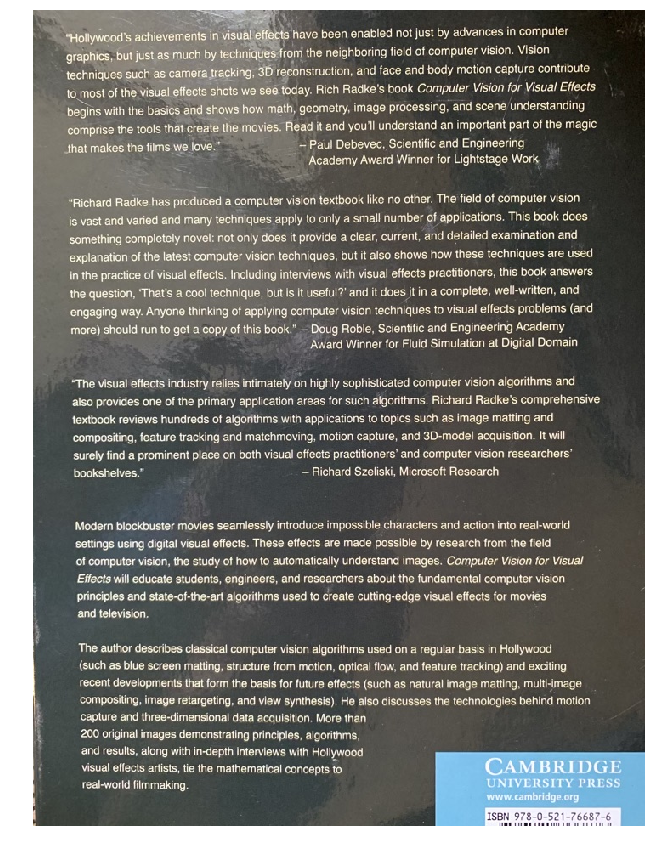

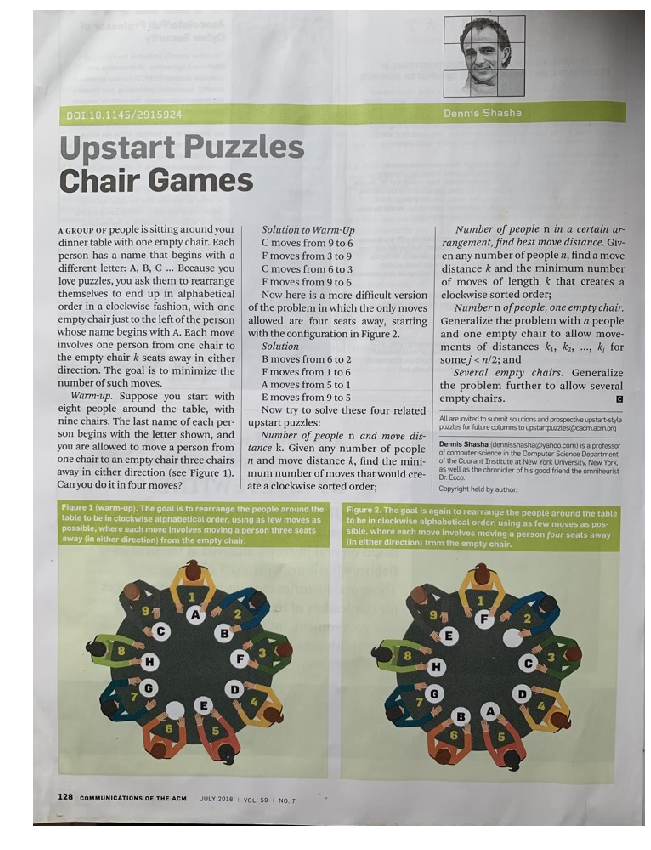

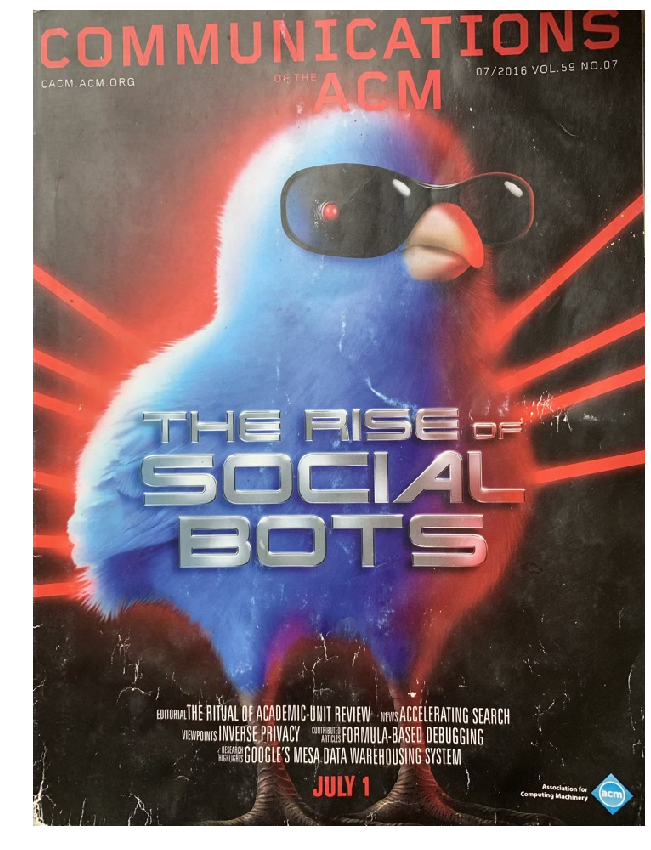

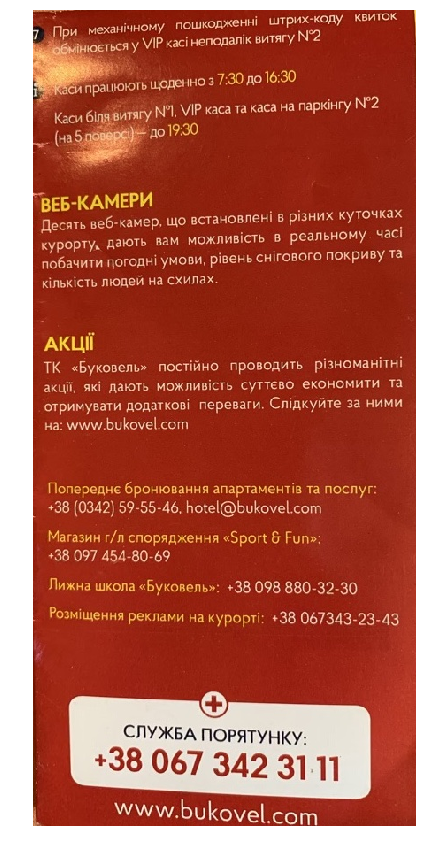

In [50]:
visualize(images)

In [54]:
def separate_text(img, n_patches_x=10, n_patches_y=3):
    
    # convert to grayscale
    grayscaled = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2GRAY)    
    result = 255 * np.ones(grayscaled.shape, dtype=np.uint8)
    
    #number of parts of image that will be analyzed separately
    #the goal - handle text with different colors
    #there are will be n_patches_x * n_patches_y windows
    
    patch_size_x = grayscaled.shape[0] // n_patches_x
    patch_size_y = grayscaled.shape[1] // n_patches_y
    
    for i in range(n_patches_x):
        
        for j in range(n_patches_y):
            
            working_part = grayscaled[i*patch_size_x:(i+1)*patch_size_x, j*patch_size_y:(j+1)*patch_size_y]
            #compute threshold between background and text (suppose there are two classes)
            background_threshold, _ = cv2.threshold(working_part, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
            
            #if quantile of intensities less than threshold, hence text is white
            if np.quantile(working_part, 0.3) < background_threshold:
                working_part = 255 - working_part
            
            # blur image and use adaptive threshold
            working_part = cv2.GaussianBlur(working_part, (3, 3), 0)
            output = cv2.adaptiveThreshold(working_part, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 5, 5)
            
            # post bluring
            output = cv2.GaussianBlur(output, (3, 3), 0)
            output = cv2.blur(output, (2, 2))
            
            # post thresholding
            _, output = cv2.threshold(output, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
            result[i*patch_size_x:(i+1)*patch_size_x, j*patch_size_y:(j+1)*patch_size_y] = output

    return result

In [55]:
outputs = list(map(separate_text, images))

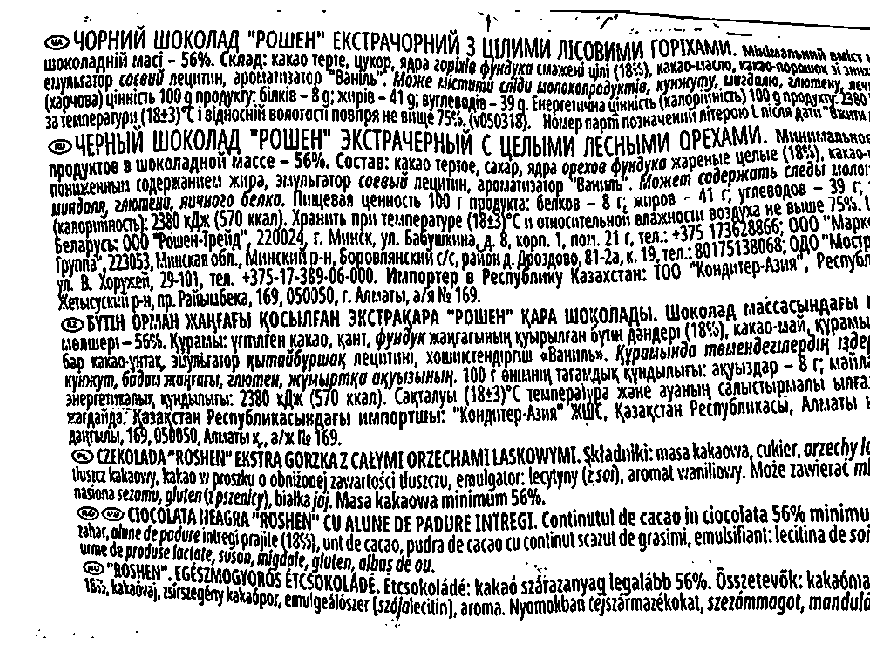

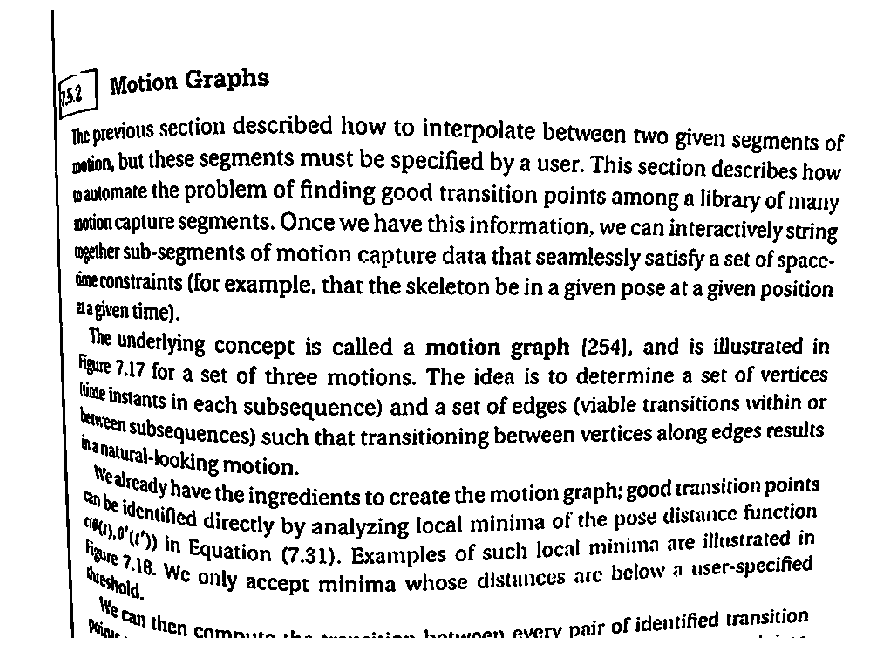

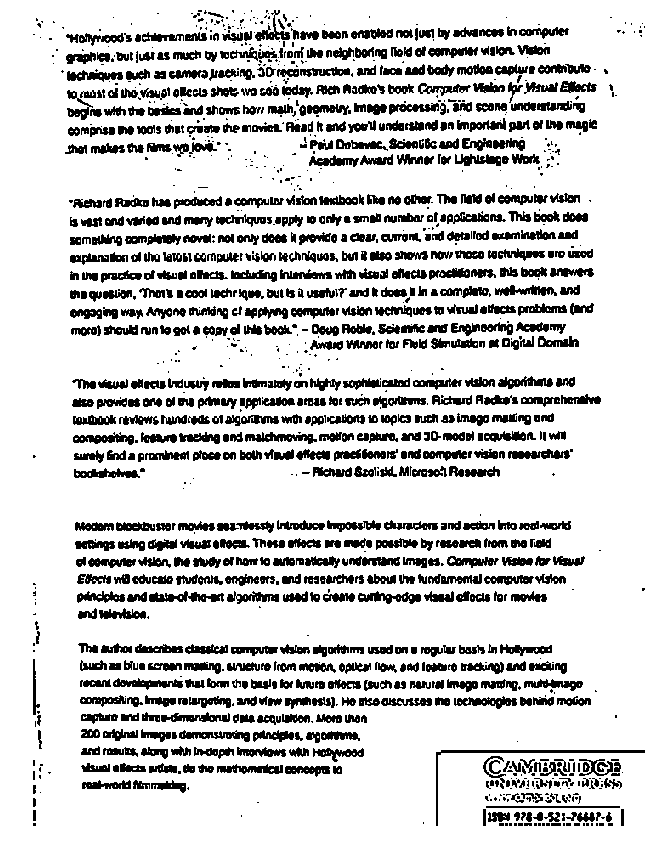

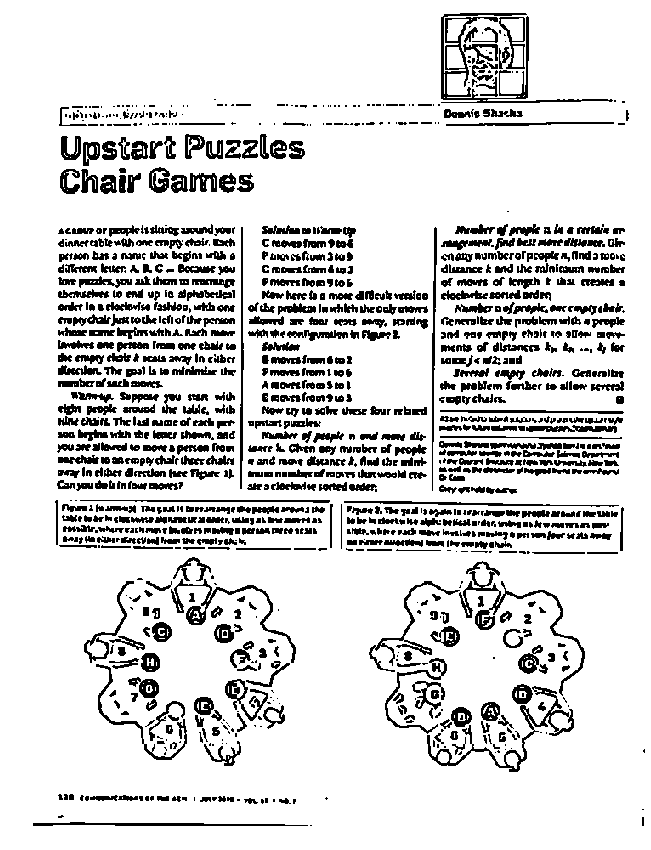

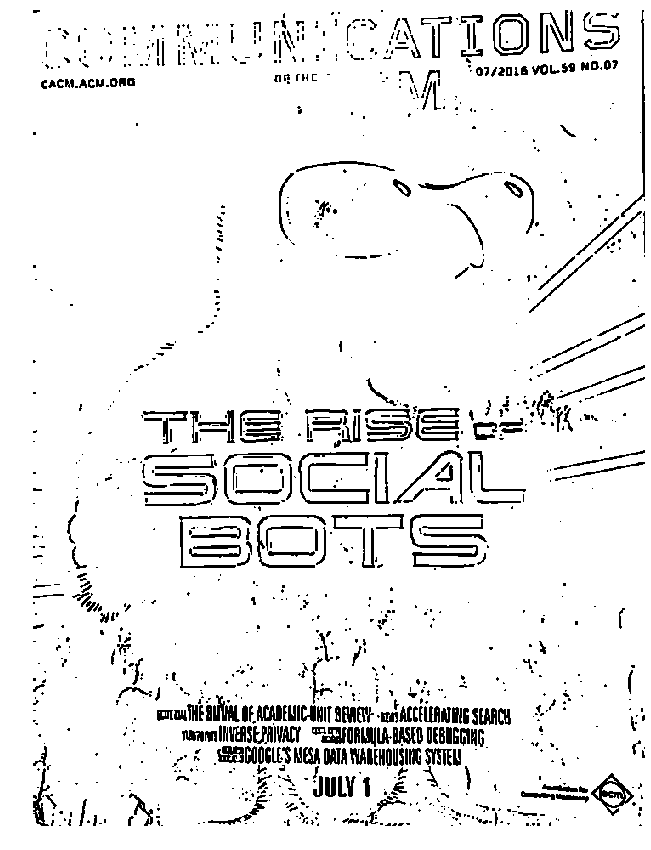

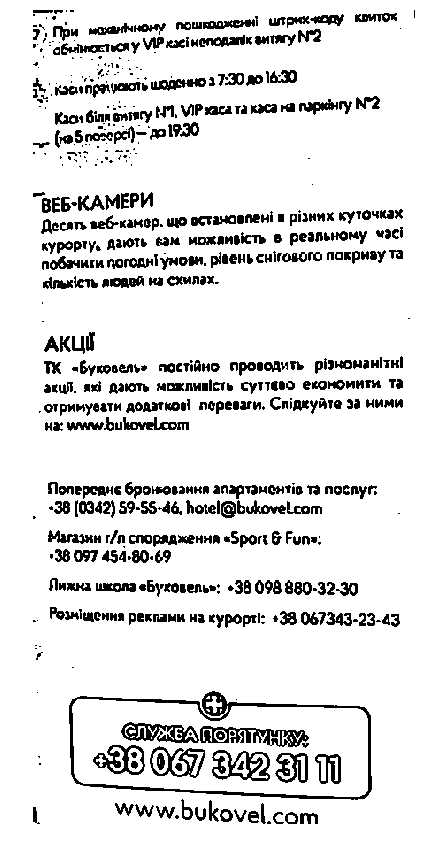

In [56]:
visualize(outputs)

## 2 - Estimate the number of objects on the images

In [59]:
working_dir = 'task2/count/'
files = next(os.walk(working_dir))[2]

In [60]:
images = []
for file in files:
    #img = Image.open(os.path.join(working_dir, file))
    
    img = cv2.imread(os.path.join(working_dir, file))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    images.append(img)

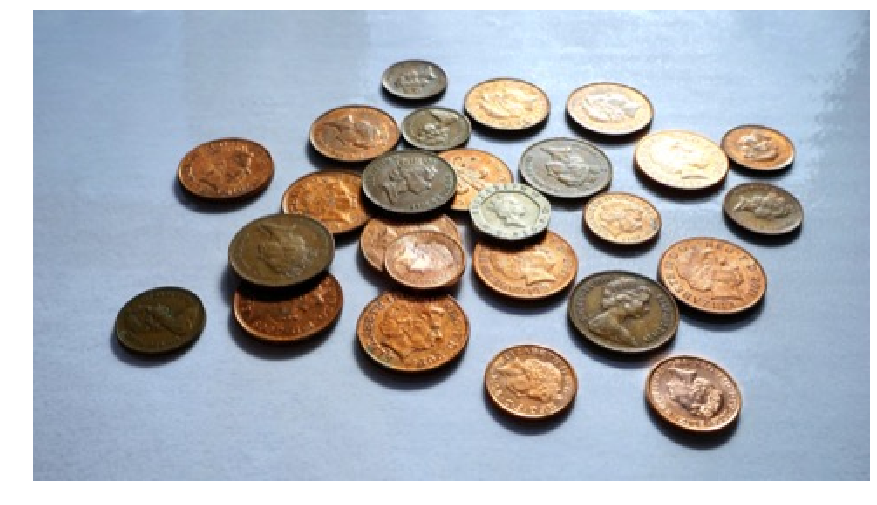

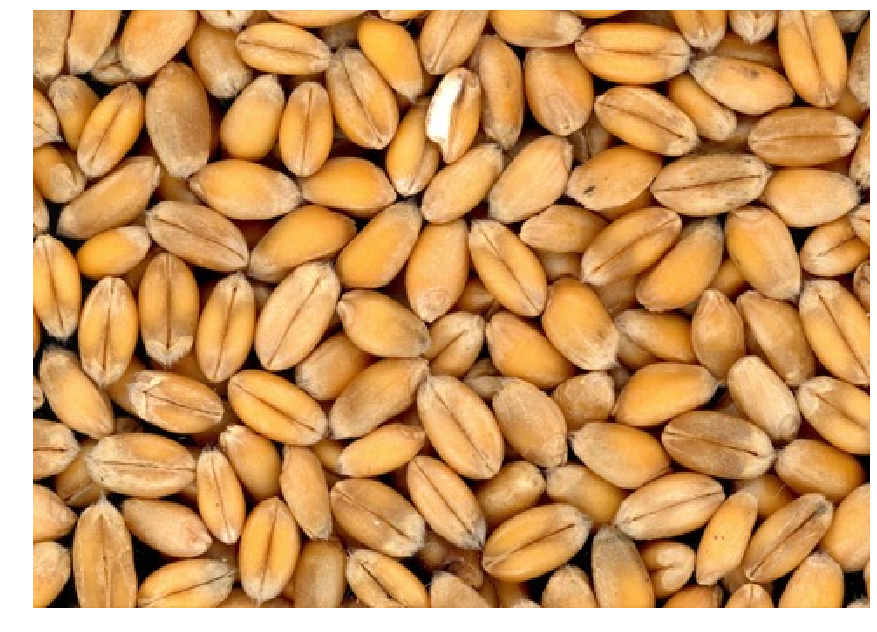

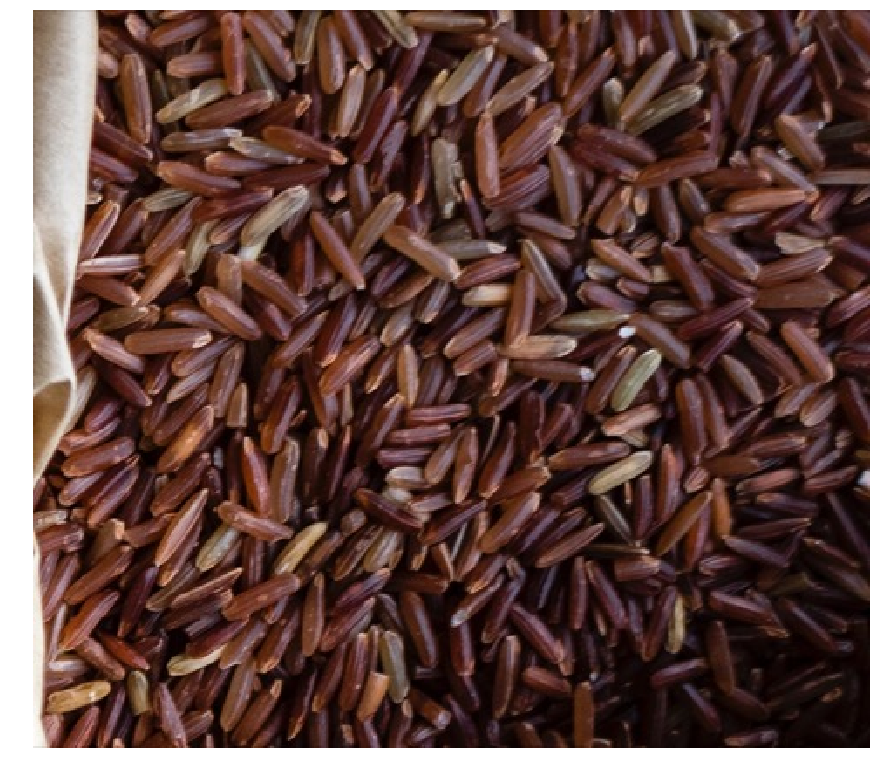

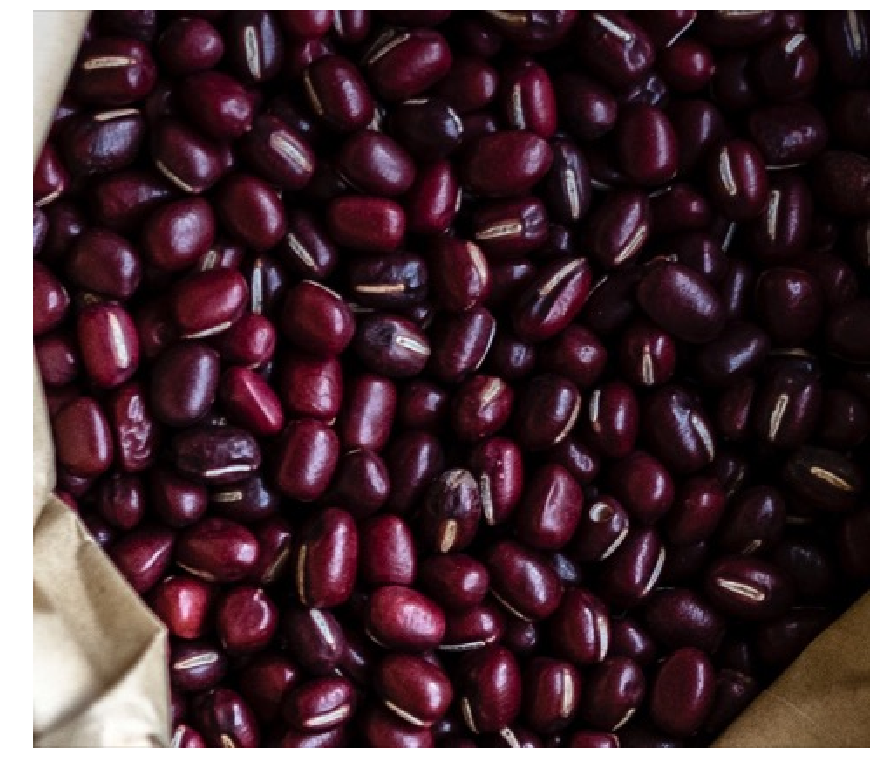

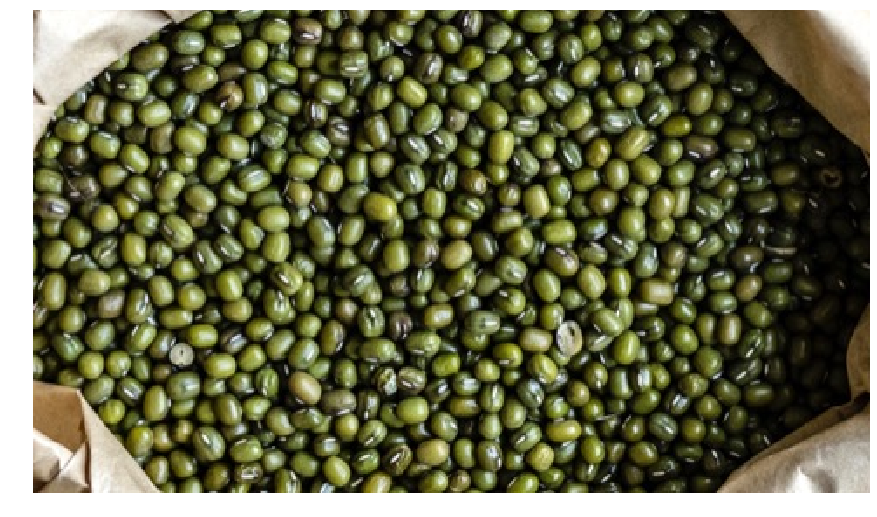

...

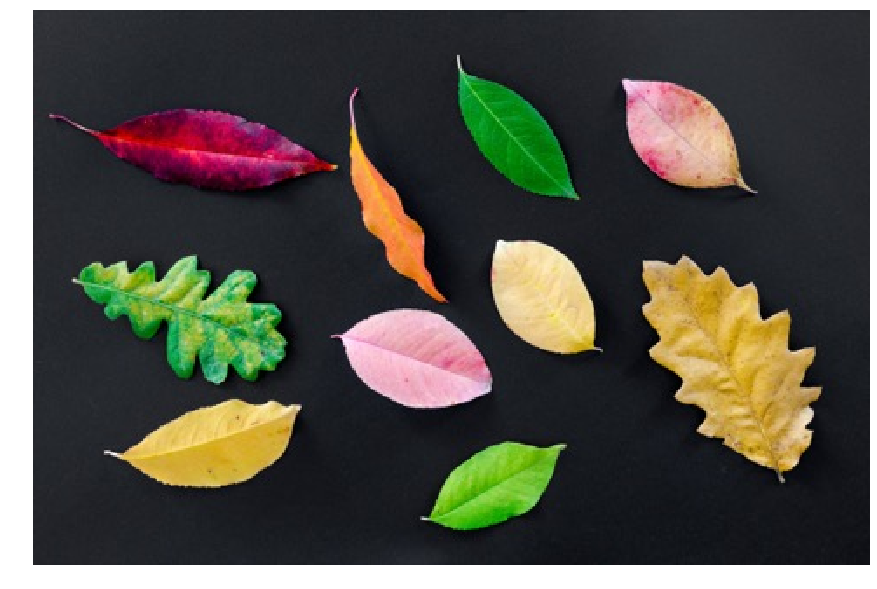

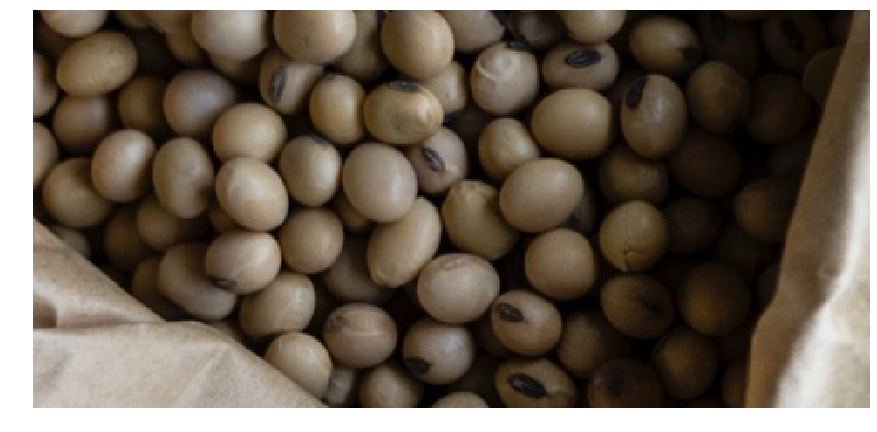

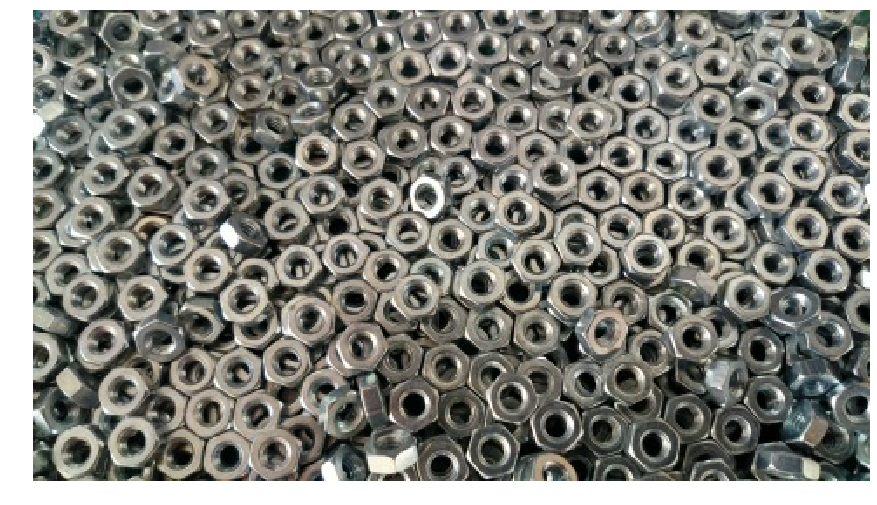

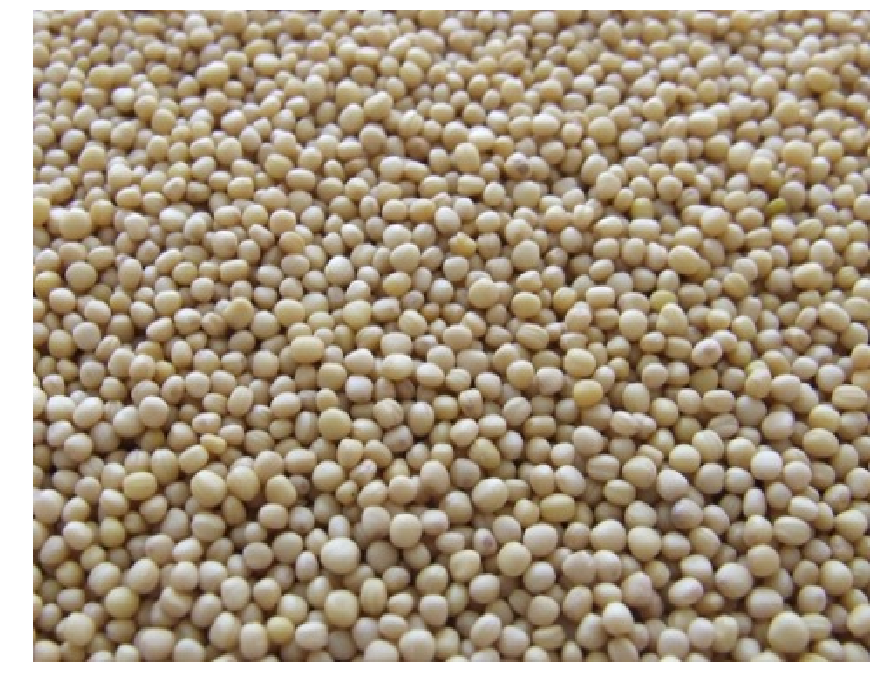

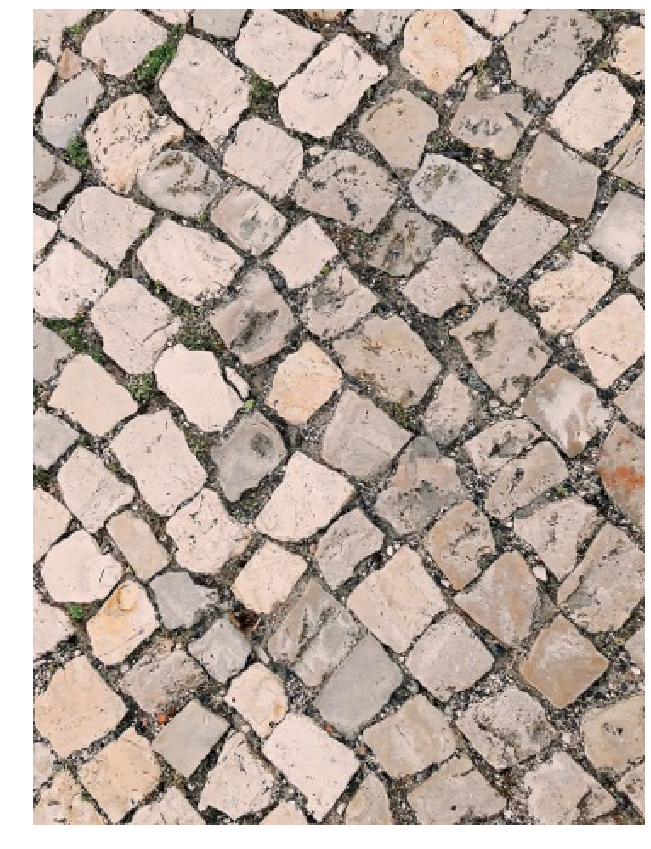

In [11]:
visualize(images)

In [63]:
def img_fill(im_in):  

    # Copy the thresholded image.
    im_floodfill = im_in.copy()

    # Mask used to flood filling.
    # Notice the size needs to be 2 pixels than the image.
    h, w = im_in.shape[:2]
    mask = np.zeros((h+2, w+2), np.uint8)

    # Floodfill from point (0, 0)
    cv2.floodFill(im_floodfill, mask, (0, 0), 0)
    cv2.floodFill(im_floodfill, mask, (w-1, 0), 0)
    cv2.floodFill(im_floodfill, mask, (w-1, h-1), 0)
    cv2.floodFill(im_floodfill, mask, (0, h-1), 0)

    # Invert floodfilled image
    im_floodfill_inv = cv2.bitwise_not(im_floodfill)
    
    # Combine the two images to get the foreground.
    fill_image = im_in | im_floodfill_inv
    
    return im_floodfill

def count_objects(img):
    
    # to grayscale and equalize distribution of intensities
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    gray = cv2.equalizeHist(gray)

    # perform cleaning and thresholding
    gray = cv2.medianBlur(gray, 3)
    gray = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 13, 13)

    # post processing
    gray = cv2.GaussianBlur(gray, (3, 3), 1)
    _, gray = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    # perform morfological separation of objects
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    gray = cv2.morphologyEx(gray, cv2.MORPH_OPEN, kernel, iterations=1)

    # post processing again
    gray = cv2.GaussianBlur(gray, (3, 3), 1)
    gray = cv2.fastNlMeansDenoising(gray, None, 70, 15, 15)
    _, gray = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    # delete background
    gray = img_fill(gray)
    
    # if objects concentrate in the small area of image, perform 
    # morphological opening with smaller kernel
    if gray.sum() / (gray.size * 255.0) < 0.16:
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
        gray = cv2.morphologyEx(gray, cv2.MORPH_OPEN, kernel, iterations=3)

    # additional processing for very small objects
    if gray.sum() / (gray.size * 255.0) < 0.05:
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (4, 4))
        gray = cv2.morphologyEx(gray, cv2.MORPH_OPEN, kernel, iterations=3)

    # distance transform between separated objects
    dist_transform = ndimage.morphology.distance_transform_edt(gray)

    # empirical estimation of min_distance
    min_distance = int(np.quantile(dist_transform[dist_transform > 0], 0.97))
    
    localMax = peak_local_max(dist_transform, indices=False, 
                              min_distance=min_distance, labels=gray)

    markers = ndimage.label(localMax)[0] 
    labels = watershed(-dist_transform, markers, mask=gray)
    
    # overall number of classes minus background
    count = len(np.unique(labels)) - 1
    
    return count

In [64]:
list(map(lambda x: count_objects(x), images))

[20, 204, 622, 145, 210, 95, 13, 8, 36, 779, 823, 106]

## 3 - Separate foreground from the background

In [15]:
working_dir = 'task3/object/'
files = next(os.walk(working_dir))[2]

In [16]:
images = []
for file in files:
    #img = Image.open(os.path.join(working_dir, file))
    
    img = cv2.imread(os.path.join(working_dir, file))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    images.append(img)

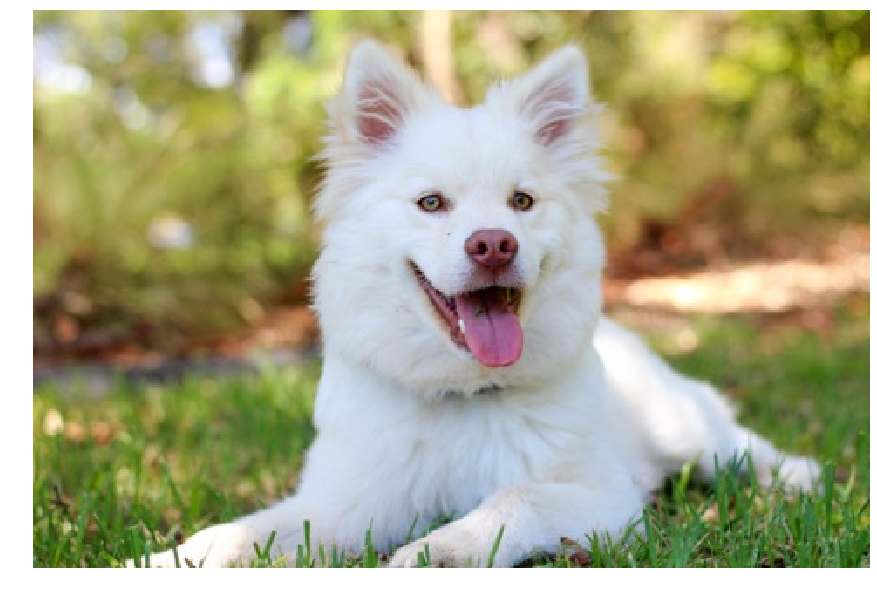

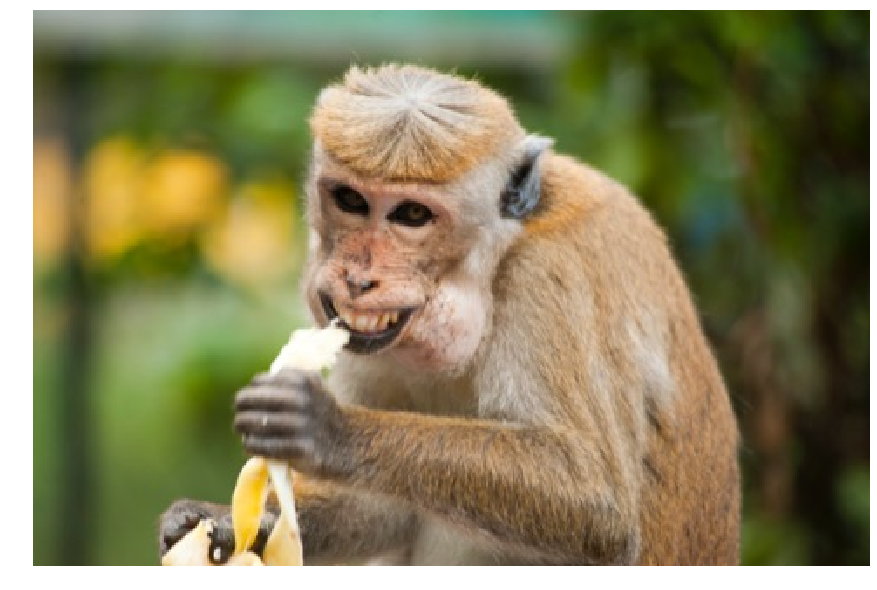

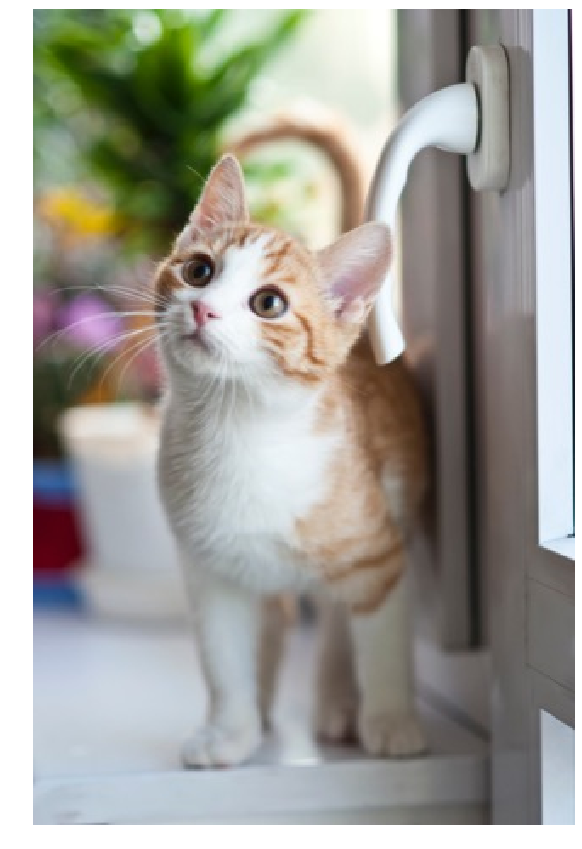

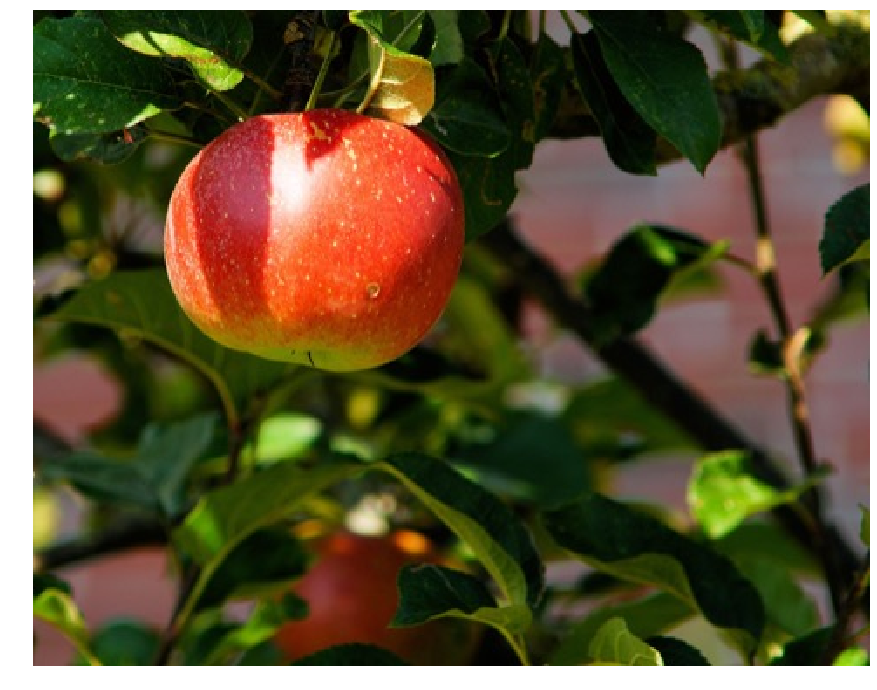

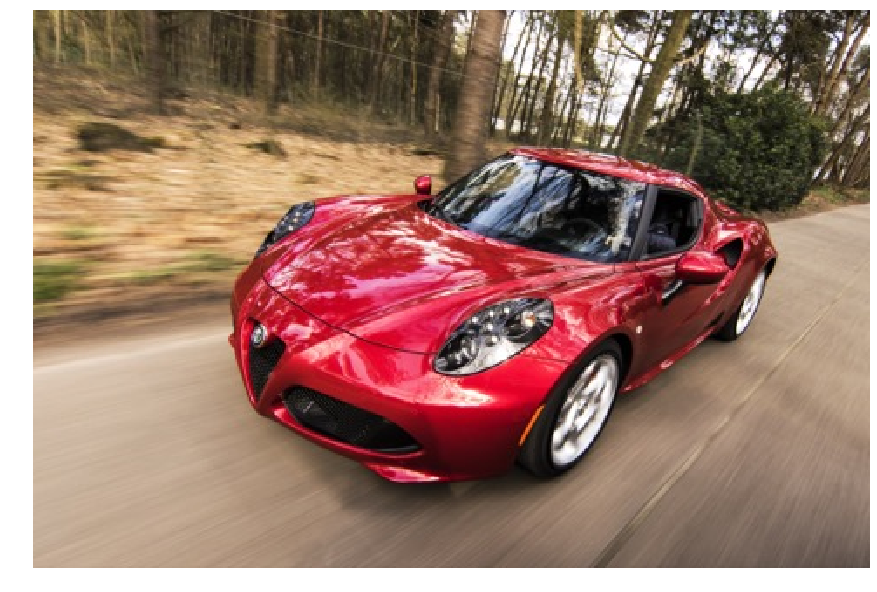

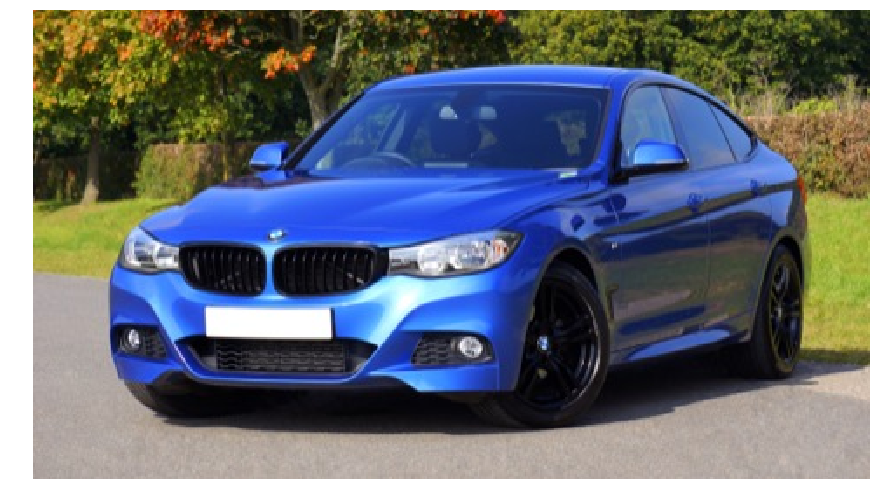

In [17]:
visualize(images)

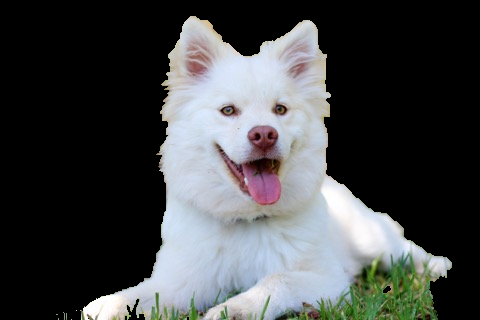

In [19]:
img = images[0]
mask = np.zeros(img.shape[:2], np.uint8)

bgdModel = np.zeros((1, 65), np.float64)
fgdModel = np.zeros((1, 65), np.float64)

rect = (25, 15, 430, 460)
z, _, _ = cv2.grabCut(img, mask, rect, bgdModel, fgdModel, 5, cv2.GC_INIT_WITH_RECT)

z = np.where((z == 2) | (z == 0), 0, 1).astype('uint8')
img = img * z[:, :, np.newaxis]
Image.fromarray(img)

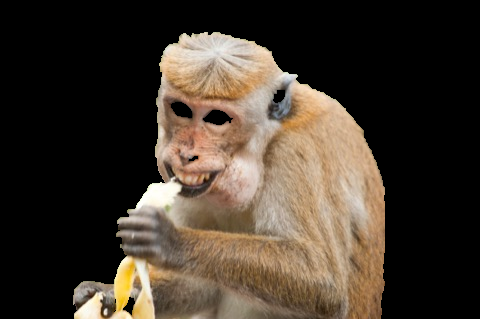

In [20]:
img = images[1]
mask = np.zeros(img.shape[:2], np.uint8)

bgdModel = np.zeros((1, 65), np.float64)
fgdModel = np.zeros((1, 65), np.float64)

rect = (55, 20, 330, 400)
z, _, _ = cv2.grabCut(img, mask, rect, bgdModel, fgdModel, 10, cv2.GC_INIT_WITH_RECT)

z = np.where((z == 2) | (z == 0), 0, 1).astype('uint8')
img = img * z[:, :, np.newaxis]
Image.fromarray(img)

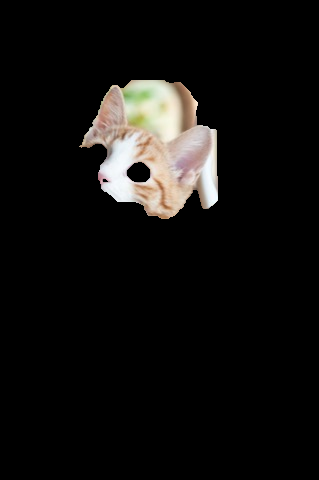

In [21]:
img = images[2]
mask = np.zeros(img.shape[:2], np.uint8)

bgdModel = np.zeros((1, 65), np.float64)
fgdModel = np.zeros((1, 65), np.float64)

rect = (50, 80, 200, 300)
z, _, _ = cv2.grabCut(img, mask, rect, bgdModel, fgdModel, 10, cv2.GC_INIT_WITH_RECT)

z = np.where((z == 2) | (z == 0), 0, 1).astype('uint8')
img = img * z[:, :, np.newaxis]
Image.fromarray(img)

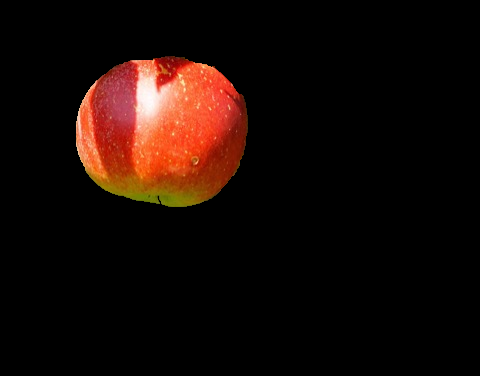

In [22]:
img = images[3]
mask = np.zeros(img.shape[:2], np.uint8)

bgdModel = np.zeros((1, 65), np.float64)
fgdModel = np.zeros((1, 65), np.float64)

rect = (20, 40, 250, 250)
z, _, _ = cv2.grabCut(img, mask, rect, bgdModel, fgdModel, 10, cv2.GC_INIT_WITH_RECT)

z = np.where((z == 2) | (z == 0), 0, 1).astype('uint8')
img = img * z[:, :, np.newaxis]
Image.fromarray(img)

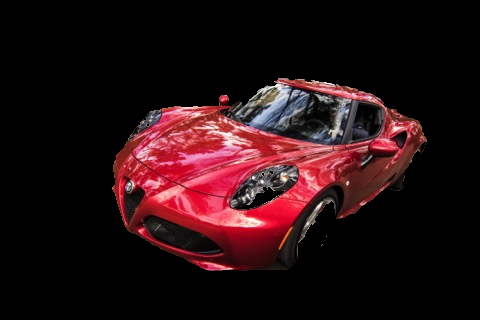

In [23]:
img = images[4]
mask = np.zeros(img.shape[:2], np.uint8)

bgdModel = np.zeros((1, 65), np.float64)
fgdModel = np.zeros((1, 65), np.float64)

rect = (30, 60, 430, 250)
z, _, _ = cv2.grabCut(img, mask, rect, bgdModel, fgdModel, 10, cv2.GC_INIT_WITH_RECT)

z = np.where((z == 2) | (z == 0), 0, 1).astype('uint8')
img = img * z[:, :, np.newaxis]
Image.fromarray(img)

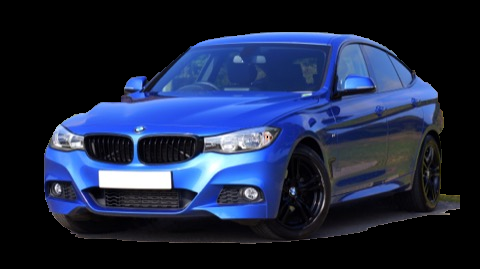

In [24]:
img = images[5]
mask = np.zeros(img.shape[:2], np.uint8)

bgdModel = np.zeros((1, 65), np.float64)
fgdModel = np.zeros((1, 65), np.float64)

rect = (10, 30, 450, 450)
z, _, _ = cv2.grabCut(img, mask, rect, bgdModel, fgdModel, 10, cv2.GC_INIT_WITH_RECT)

z = np.where((z == 2) | (z == 0), 0, 1).astype('uint8')
img = img * z[:, :, np.newaxis]
Image.fromarray(img)

## 4 - Implement affine transformation from scratch

In [25]:
working_dir = 'task4/data/'
files = next(os.walk(working_dir))[2]

In [26]:
images = []
for file in files:
    #img = Image.open(os.path.join(working_dir, file))
    
    img = cv2.imread(os.path.join(working_dir, file))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    images.append(img)

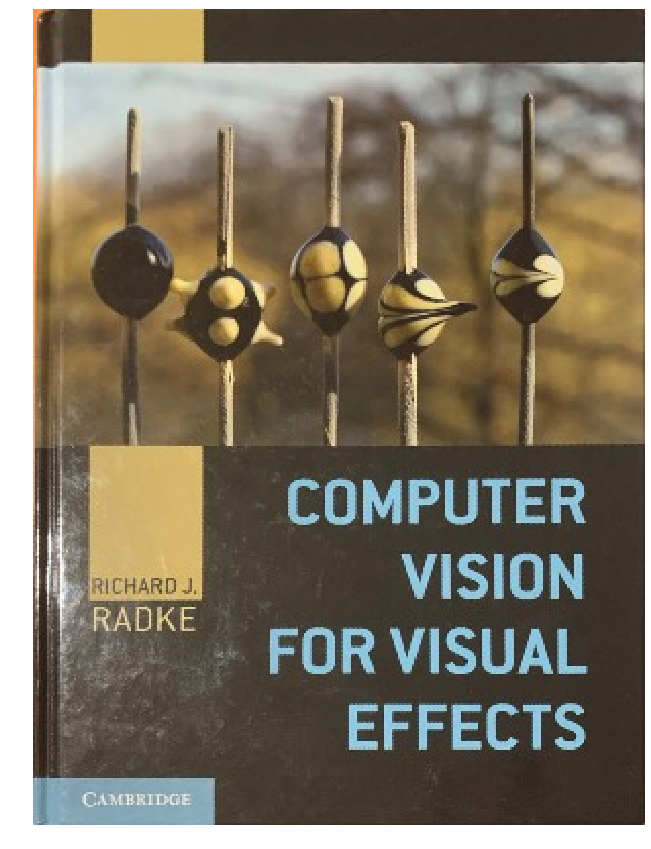

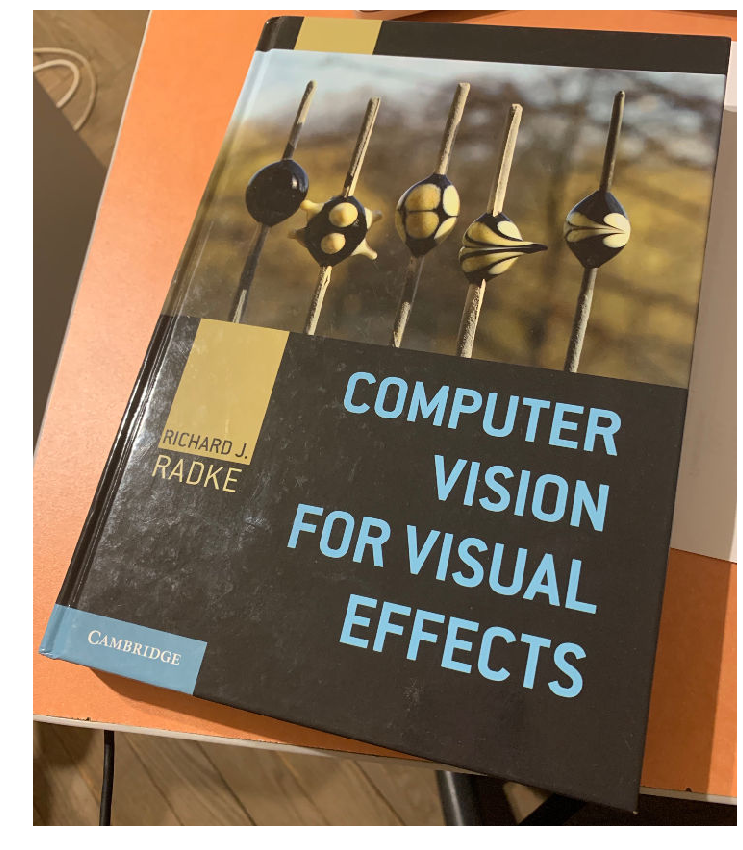

In [27]:
visualize(images)

In [28]:
dst = np.array([(0, 299), (0, 0), (399, 0)]).astype(np.float32)
src = np.array([(8, 665), (245, 11), (723, 28)]).astype(np.float32)

In [29]:
matrix = cv2.getAffineTransform(src, dst)

In [30]:
matrix

array([[ 8.24106796e-01,  2.98644206e-01, -2.05191251e+02],
       [-1.60528801e-02,  4.51369216e-01, -1.03210576e+00]])

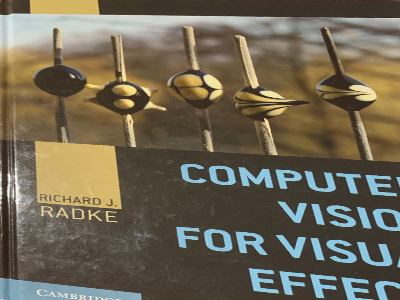

In [31]:
output = cv2.warpAffine(images[1], matrix, images[0].shape[:2])
Image.fromarray(output)

In [32]:
def affine(src, dst):

    dst_mod = np.concatenate((dst, np.ones((1, 3)).T), axis=1)
    src_mod = np.concatenate((src, np.ones((1, 3)).T), axis=1)
    
    # solve matrix equation
    matrix = dst_mod.T @ np.linalg.inv(src_mod.T)
    matrix = matrix[:-1]
    
    return matrix

In [33]:
affine_matrix = affine(src, dst)

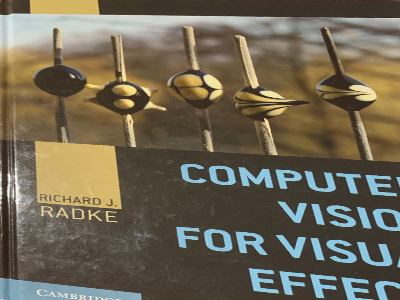

In [34]:
output = cv2.warpAffine(images[1], affine_matrix, images[0].shape[:2])
Image.fromarray(output)

In [35]:
np.linalg.norm(affine_matrix - matrix)

8.528395519041156e-14

## 5 - Implement homography from scratch

In [36]:
dst = np.array([(0, 299), (0, 0), (399, 0), (399, 299)]).astype(np.float32)
src = np.array([(8, 665), (245, 11), (723, 28), (625, 833)]).astype(np.float32)

In [37]:
perspective_matrix = cv2.getPerspectiveTransform(src, dst)

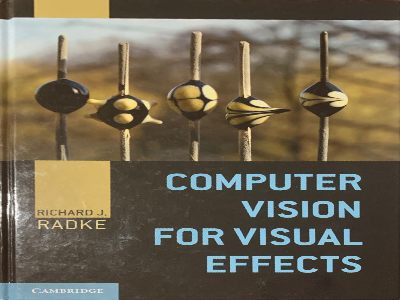

In [38]:
output = cv2.warpPerspective(images[1], perspective_matrix, images[0].shape[:2])
Image.fromarray(output)

In [39]:
def homography(src, dst):
    
    assert src.shape == dst.shape
    src = src.T
    dst = dst.T

    n_size = src.shape[1]
    a = np.zeros((2*n_size, 9))
    
    # creating equation Ax = 0
    for i in range(n_size):
        a[2 * i] = [-src[0][i], -src[1][i], -1, 0, 0, 0, dst[0][i] * src[0][i], dst[0][i] * src[1][i],
                    dst[0][i]]
        a[2 * i + 1] = [0, 0, 0, -src[0][i], -src[1][i], -1, dst[1][i] * src[0][i], dst[1][i] * src[1][i],
                        dst[1][i]]
        
    u, s, v = np.linalg.svd(a, full_matrices=True)
    homography_matrix = v[-1].reshape((3, 3))
    
    homography_matrix = homography_matrix / homography_matrix[2, 2]
    
    return homography_matrix

In [40]:
perspective_matrix

array([[ 1.03922207e+00,  3.76598823e-01, -2.58751994e+02],
       [-2.32224914e-02,  6.52961817e-01, -1.49306959e+00],
       [ 3.35181256e-04,  6.67583702e-04,  1.00000000e+00]])

In [41]:
homography(src, dst)

array([[ 1.03922207e+00,  3.76598823e-01, -2.58751994e+02],
       [-2.32224914e-02,  6.52961817e-01, -1.49306959e+00],
       [ 3.35181256e-04,  6.67583702e-04,  1.00000000e+00]])

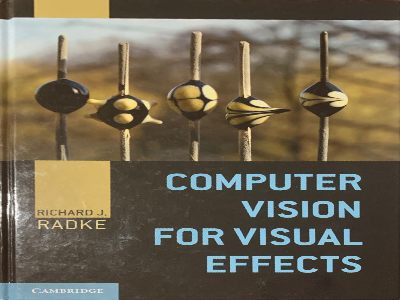

In [42]:
output = cv2.warpPerspective(images[1], homography(src, dst), images[0].shape[:2])
Image.fromarray(output)

In [43]:
np.linalg.norm(perspective_matrix - homography(src, dst))

3.231867740309807e-09